In [252]:
import pandas
import os
import json
import pydantic
import glob

In [253]:
EXTRACTED_GAMES_PATH = os.path.join(os.getcwd(), 'extracted_games')
MAPPING_GAMES_PATH = os.path.join(os.getcwd(), 'mapping_data')
brackets = ['game-changers', 'vct-challengers', 'vct-international']
years = ['2022', '2023', '2024']

In [254]:
all_games = []
all_mapping = {}
all_players_mapping = {}
leagues_mapping = {}
teams_mapping = {}
tournaments_mapping = {}
for bracket in brackets:
    with open(os.path.join(MAPPING_GAMES_PATH, bracket, 'mapping_data.json'), 'r') as f:
        all_mapping[bracket]=json.load(f)

    with open(os.path.join(MAPPING_GAMES_PATH, bracket, 'players.json'), 'r', encoding="utf8") as p:
        all_players_mapping[bracket]=json.load(p)

    with open(os.path.join(MAPPING_GAMES_PATH, bracket, 'leagues.json'), 'r') as l:
        leagues_mapping[bracket]=json.load(l)

    with open(os.path.join(MAPPING_GAMES_PATH, bracket, 'teams.json'), 'r') as t:
        teams_mapping[bracket]=json.load(t)

    with open(os.path.join(MAPPING_GAMES_PATH, bracket, 'tournaments.json'), 'r') as tn:
        tournaments_mapping[bracket]=json.load(tn)

    for year in years:
        games = glob.glob(os.path.join(EXTRACTED_GAMES_PATH, bracket, year, '*.json'))
        for g in games:
            with open(g, 'r') as f:
                all_games.append(json.load(f))

        



In [255]:
gg2 = {}

for k, v in all_players_mapping.items():
    for p in v:
        gg2[p['id']] = k

print(gg2)



{'107025876564296044': 'game-changers', '106977714184829995': 'vct-challengers', '107176790303905255': 'game-changers', '107282855606202828': 'game-changers', '106977742188901804': 'game-changers', '106982393485522814': 'game-changers', '106978667986810556': 'game-changers', '107604724069883846': 'game-changers', '106732694881302524': 'vct-international', '107604738642175904': 'game-changers', '108172473422865130': 'vct-challengers', '107694364579174172': 'game-changers', '107691408114291122': 'game-changers', '107897751895646748': 'game-changers', '107875215616219279': 'game-changers', '108939740305581424': 'game-changers', '108449805893915911': 'game-changers', '106977647697364508': 'game-changers', '107115831389167224': 'vct-challengers', '107897747977708025': 'game-changers', '107115843208519317': 'vct-challengers', '109030015524722167': 'game-changers', '109080890049366669': 'vct-international', '107176767912598458': 'game-changers', '107600814291408873': 'game-changers', '1098812

In [256]:
def get_mapping_from_game(game, mapping):
    for k in mapping:
        for m in mapping[k]:
            if m['platformGameId'] == f'val:{game['id']}':
                return m
    print('couldnt find game')
    return None

In [257]:
# per player processing
# per game per player
# per player per round
#Are they a feast or famine player? (std deviation of kills per round) (easy)
#Which agents do they play? Statistics per agent (easy)
#Which roles do they play (sentinel, duelist, etc.)? Use agents to answer this (easy)
#Per map winrates (easy)
#Player-to-player matchup winrates (easy)
#X-factors (1v1+ winrates, multikills, first bloods) (medium)
#-> per player per round
#Weapon distribution? (easy)
#Ability usage? (easy)
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
pandas.set_option("future.no_silent_downcasting", True)
import pandas as pd
import numpy as np

In [258]:
### Converts Json data into pandas datafames for easy manipulation
leagues_mapping_df = pd.json_normalize([x for sublist in list(leagues_mapping.values()) for x in sublist])
teams_mapping_df = pd.json_normalize([x for sublist in list(teams_mapping.values()) for x in sublist])
tournaments_mapping_df = pd.json_normalize([x for sublist in list(tournaments_mapping.values()) for x in sublist])
all_players_mapping_df = pd.json_normalize([x for sublist in list(all_players_mapping.values()) for x in sublist])
all_mapping_df = pd.json_normalize([x for sublist in list(all_mapping.values()) for x in sublist])

### Deduplication
leagues_mapping_df = leagues_mapping_df.drop_duplicates(subset=['league_id'])
teams_mapping_df = teams_mapping_df.drop_duplicates(subset=['id'])
tournaments_mapping_df = tournaments_mapping_df.drop_duplicates(subset=['id'])
all_players_mapping_df = all_players_mapping_df.drop_duplicates(subset=['id'])
all_mapping_df = all_mapping_df.drop_duplicates(subset=['platformGameId'])

In [259]:
tournaments_mapping_df

,id,status,league_id,time_zone,name,start_time,end_time
0,107175003635964716,published,106375817979489820,Etc/UTC,stage_02,NaN,NaN
1,108490384940728464,published,106375817979489820,Etc/UTC,game_changers_br_s1,NaN,NaN
2,111007250890578805,published,106375817979489820,America/Sao_Paulo,game_changers_br_2023,NaN,NaN
3,112787120263393743,published,106375817979489820,Europe/Sarajevo,game_changers_br_stage_2_2024,NaN,NaN
4,109134639255397767,published,106375817979489820,Etc/UTC,gc_etapa_2,NaN,NaN
...,...,...,...,...,...,...,...
257,111811151250338218,published,109974795266458277,Europe/Sarajevo,vct_americas_kickoff_2024,NaN,NaN
258,107254687577255108,published,107254585505459304,Etc/UTC,champions_2021,NaN,NaN
259,108871629797692793,published,107254585505459304,Etc/UTC,champions_2022,NaN,NaN
260,112053452805788444,published,107254585505459304,Europe/Sarajevo,vct_champions_2024,NaN,NaN


In [260]:
all_games_and_players_df = None
all_games_and_teams_df = None
pd.set_option("future.no_silent_downcasting", True)
for g in all_games:
    mapping = get_mapping_from_game(g, all_mapping)
    
    #print(mapping)
    # pid gameid -> stats for a single game
    # pid stats -> stats for all games
    teams_normalized = pd.json_normalize(
    g['teams'], 
    'players', 
    ['id', 'side'], 
    record_prefix='player_'
    )
    
    # Rename some columns to match the SQL-like query format
    teams_normalized.rename(
        columns={'id': 'team_id', 'side': 'team_side'}, 
        inplace=True
    )

    # Add wins and losses columns based on the game winner
    teams_normalized['wins'] = teams_normalized['team_side'].apply(lambda x: 1 if x == g['winner'] else 0)
    teams_normalized['loss'] = 1 - teams_normalized['wins']

    # Select relevant columns for querying
    teams_df = teams_normalized[[
        'player_id', 'team_id', 'wins', 'loss', 'player_agent', 'player_kills', 'player_deaths', 
        'player_assists', 'player_first_bloods', 'player_first_deaths', 'player_clutches', 
        'player_combat_score', 'player_rounds'
    ]]

    # takes the dataframe and replaces the player id with the id from the mapping data
    # filters out the '-' instances which are null instances of the player 
    #print(teams_df)
    teams_df['player_id'].replace({int(k): v for k,v in mapping['participantMapping'].items()}, inplace=True)
    teams_df.loc[:, 'player_id'] = teams_df.loc[teams_df['player_id'] != '-']
    teams_df.loc[:, 'player_id'] = teams_df['player_id'].fillna(-1).astype(np.int64)    
    teams_df['team_id'].replace({int(k): v for k,v in mapping['teamMapping'].items()}, inplace=True)
    teams_df = teams_df.loc[teams_df['team_id'] != '-']
    teams_df.loc[:, 'team_id'] = teams_df['team_id'].fillna(-1).astype(np.int64)
    all_games_and_players_df = pd.concat([all_games_and_players_df, teams_df], ignore_index=True)

/tmp/ipykernel_210623/916870575.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teams_df['player_id'].replace({int(k): v for k,v in mapping['participantMapping'].items()}, inplace=True)
/tmp/ipykernel_210623/916870575.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teams_df['team_id'].replace({int(k): v for k,v in mapping['teamMapping'].items()}, inplace=True)
/tmp/ipykernel_210623/916870575.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-vi

In [261]:
games_of_player_id = all_games_and_players_df.loc[all_games_and_players_df['player_id'] == 106371583096241717]
print(games_of_player_id)

               player_id             team_id  wins  loss player_agent  \
0     106371583096241717  107605767634609340     0     1       Breach   
88    106371583096241717  107605767634609340     0     1         Sage   
390   106371583096241717  107605767634609340     0     1      Killjoy   
584   106371583096241717  107605767634609340     1     0        KAY/O   
603   106371583096241717  107605767634609340     1     0       Breach   
725   106371583096241717  107605767634609340     1     0        KAY/O   
1014  106371583096241717  107605767634609340     1     0        KAY/O   
1269  106371583096241717  107605767634609340     1     0         Raze   
1274  106371583096241717  107605767634609340     1     0      Killjoy   
1478  106371583096241717  107605767634609340     1     0        KAY/O   
1827  106371583096241717  107605767634609340     1     0        KAY/O   
2037  106371583096241717  107605767634609340     1     0         Sage   
2042  106371583096241717  107605767634609340     1 

In [262]:
from collections import Counter

# Mapping of agents to roles
agent_to_role = {
    'Brimstone': 'Controller',
    'Viper': 'Controller',
    'Omen': 'Controller',
    'Killjoy': 'Sentinel',
    'Cypher': 'Sentinel',
    'Sova': 'Initiator',
    'Sage': 'Sentinel',
    'Phoenix': 'Duelist',
    'Jett': 'Duelist',
    'Reyna': 'Duelist',
    'Raze': 'Duelist',
    'Breach': 'Initiator',
    'Skye': 'Initiator',
    'Yoru': 'Duelist',
    'Astra': 'Controller',
    'KAY/O': 'Initiator',
    'Chamber': 'Sentinel',
    'Neon': 'Duelist',
    'Fade': 'Initiator',
    'Harbor': 'Controller',
    'Gekko': 'Initiator',
    'Deadlock': 'Sentinel',
    'Iso': 'Duelist',
    'Clove': 'Controller',
    'Vyse': 'Sentinel'
}

# Add player_role column based on player_agent
all_games_and_players_df['player_role'] = all_games_and_players_df['player_agent'].map(agent_to_role)

# Group by player_id and aggregate
def aggregate_player_data(df):
    aggregated_data = []
    
    for player_id, group in df.groupby('player_id'):
        print(f"Processing player_id: {player_id}")
        
        # Sum columns
        wins = group['wins'].sum()        
        losses = group['loss'].sum()        
        kills = group['player_kills'].sum()        
        deaths = group['player_deaths'].sum()        
        assists = group['player_assists'].sum()        
        first_bloods = group['player_first_bloods'].sum()        
        first_deaths = group['player_first_deaths'].sum()        
        clutches = group['player_clutches'].sum()        
        combat_score = group['player_combat_score'].sum()
        
        # Top 3 agents
        agent_counter = Counter(group['player_agent'])
        top_3_agents = tuple([agent for agent, _ in agent_counter.most_common(3)])

         # Filter out 'Unknown' weapon
        all_primaries = []
        for rounds in group['player_rounds']:
            primaries = [round_info['primary'] for round_info in rounds if round_info['primary'] != 'Unknown']
            all_primaries.extend(primaries)
        # Top 2 primary weapons
        primary_counter = Counter(all_primaries)
        top_2_primaries = [primary for primary, _ in primary_counter.most_common(2)]


        # Standard deviation of kills per game (feast or famine player)
        kills_std_dev = group['player_kills'].std()
        
        # Roles played
        role_counter = Counter(group['player_role'])
        top_roles = tuple([role for role, _ in role_counter.most_common()])
        
        # Winrate per map
        #map_winrates = group.groupby('map_name').apply(lambda x: x['wins'].sum() / len(x)).to_dict()
        
        # Append aggregated data
        aggregated_data.append({
            'player_id': player_id,
            'team_id': group['team_id'].iloc[0],
            'wins': wins,
            'loss': losses,
            'player_kills': kills,
            'player_deaths': deaths,
            'player_assists': assists,
            'player_kda': (kills + assists) / deaths,
            'player_first_bloods': first_bloods,
            'player_first_deaths': first_deaths,
            'player_clutches': clutches,
            'player_combat_score': combat_score / (wins + losses),
            'top_3_agents': top_3_agents,
            'top_2_primaries': top_2_primaries,
            'kills_std_dev': kills_std_dev,
            'top_roles': top_roles,
            #'map_winrates': map_winrates
        })
    
    return pd.DataFrame(aggregated_data)
zaza = all_games_and_players_df
gg = aggregate_player_data(all_games_and_players_df)
gg = gg[gg['player_id']>-1]
print(gg)

Processing player_id: -1
Processing player_id: 99566407765334300
Processing player_id: 103537287230111095
Processing player_id: 106116425673582104
Processing player_id: 106116439896241774
Processing player_id: 106116440965658227
Processing player_id: 106116463555917446
Processing player_id: 106116464662455844
Processing player_id: 106116466339063337
Processing player_id: 106116469240407598
Processing player_id: 106116490671167384
Processing player_id: 106116492286441131
Processing player_id: 106116500399695445
Processing player_id: 106116506186983006
Processing player_id: 106116511181190854
Processing player_id: 106116513712191179
Processing player_id: 106116516312463057
Processing player_id: 106116517250836076
Processing player_id: 106116518875772631
Processing player_id: 106116521073981149
Processing player_id: 106116523403589346
Processing player_id: 106116524342027888
Processing player_id: 106116525718283893
Processing player_id: 106116526654494663
Processing player_id: 10611653195

In [263]:
all_players_mapping_df.loc[all_players_mapping_df['id'] == str(112484821713719536)]

,id,handle,first_name,last_name,status,photo_url,home_team_id,created_at,updated_at
5729,112484821713719536,roud1,Zhihua,Ke,active,https://s3.us-west-2.amazonaws.com/static.lole...,105749556339381019,2024-05-22T12:52:58Z,2024-05-22T12:52:58Z


In [264]:

# Test that team_id is right
for x, y in zip(all_games_and_players_df['player_id'], all_games_and_players_df['team_id']):
    print(all_players_mapping_df.loc[all_players_mapping_df['id'] == str(x)]['home_team_id'].tolist())
    print(y)


['112251475551076579']
107605767634609340
['108452406268738690']
107605767634609340
['107605767634609340']
107605767634609340
['107605767634609340']
107605767634609340
['107605767634609340']
107605767634609340
['107021298845350518']
105720640249797517
['105720640249797517']
105720640249797517
['105720640249797517']
105720640249797517
['105720640249797517']
105720640249797517
['105720640249797517']
105720640249797517
['108748177717149112']
108748177717149112
['108748177717149112']
108748177717149112
['108748177717149112']
108748177717149112
['108748177717149112']
108748177717149112
['108748177717149112']
108748177717149112
['108748177717149112']
108748169745284534
['108748169745284534']
108748169745284534
['108748169745284534']
108748169745284534
['108748169745284534']
108748169745284534
['108748169745284534']
108748169745284534
['109080945899069171']
109080945899069171
['107185970379663407']
109080945899069171
['109080945899069171']
109080945899069171
['109080945899069171']
10908094589

In [265]:

teams_with_region_df = teams_mapping_df.merge(leagues_mapping_df, left_on='home_league_id', right_on='league_id', how='left')

gg = gg.merge(teams_with_region_df[['id', 'region']].astype({'id':np.int64, 'region':str}), left_on='team_id', right_on='id', how='left')


gg = gg.drop('id', axis=1)

print(gg)

               player_id             team_id  wins  loss  player_kills  \
0      99566407765334300  105665869861005803    57    45          1363   
1     103537287230111095  105680972836508184    95    41          1553   
2     106116425673582104  109637705013640848    32    25           873   
3     106116439896241774  108844205153870167    32    34           908   
4     106116440965658227  107745125595754895    96    58          2920   
...                  ...                 ...   ...   ...           ...   
2152  112829096887354461  111006703702614704     0     2            23   
2153  112829098135710904  111006703702614704     0     1             9   
2154  112829099617017574  111006703702614704     0     3            52   
2155  112840152290521871  112127272470502649     0     5            47   
2156  112891299631595293  107910153514729818     5     1           130   

      player_deaths  player_assists  player_kda  player_first_bloods  \
0              1478             833    

In [266]:
teams_with_region_df

,id,acronym,home_league_id,dark_logo_url_x,light_logo_url_x,slug_x,name_x,league_id,region,dark_logo_url_y,light_logo_url_y,name_y,slug_y
0,111006711389612074,LH,109029777807406730,http://static.lolesports.com/teams/16938279917...,http://static.lolesports.com/teams/16938279917...,lunatichai-flax,Lunatic-hai flax,109029777807406730,KR,http://static.lolesports.com/leagues/166366237...,http://static.lolesports.com/leagues/166366237...,game_changers_kr,game_changers_kr
1,109029888698112406,LWE,109029777807406730,http://static.lolesports.com/teams/16636640700...,http://static.lolesports.com/teams/16636640700...,lone-way-esports,Lone Way E-SPORTS,109029777807406730,KR,http://static.lolesports.com/leagues/166366237...,http://static.lolesports.com/leagues/166366237...,game_changers_kr,game_changers_kr
2,112439820691490172,MIR,109029777807406730,http://static.lolesports.com/teams/17218115286...,http://static.lolesports.com/teams/17218115286...,mir-gaming,MIR Gaming,109029777807406730,KR,http://static.lolesports.com/leagues/166366237...,http://static.lolesports.com/leagues/166366237...,game_changers_kr,game_changers_kr
3,112439825505751243,STG,109029777807406730,None,http://static.lolesports.com/teams/17156955705...,special-tigers-gc,Special TiGers GC,109029777807406730,KR,http://static.lolesports.com/leagues/166366237...,http://static.lolesports.com/leagues/166366237...,game_changers_kr,game_changers_kr
4,112439841344832900,PIX,109029777807406730,None,http://static.lolesports.com/teams/17156958114...,pixel,Pixel,109029777807406730,KR,http://static.lolesports.com/leagues/166366237...,http://static.lolesports.com/leagues/166366237...,game_changers_kr,game_changers_kr
...,...,...,...,...,...,...,...,...,...,...,...,...,...
857,107939538812978854,GMB,106109559530232966,http://static.lolesports.com/teams/16470266522...,http://static.lolesports.com/teams/16470266522...,gambit-esports,Gambit Esports,106109559530232966,INTL,http://static.lolesports.com/leagues/167872405...,http://static.lolesports.com/leagues/167956345...,vct_emea,vct_emea
858,108241004210065453,KC,106109559530232966,http://static.lolesports.com/teams/16516266491...,http://static.lolesports.com/teams/16516266491...,karmine-corp,Karmine Corp,106109559530232966,INTL,http://static.lolesports.com/leagues/167872405...,http://static.lolesports.com/leagues/167956345...,vct_emea,vct_emea
859,111878219240115813,DRG,111691194187846945,http://static.lolesports.com/teams/17071261437...,http://static.lolesports.com/teams/17071261437...,dragon-ranger-gaming,DRAGON RANGER GAMING,111691194187846945,CN,http://static.lolesports.com/leagues/170427236...,http://static.lolesports.com/leagues/170427236...,vct_china,vct_china
860,111878284177290231,TEC,111691194187846945,http://static.lolesports.com/teams/17071271346...,http://static.lolesports.com/teams/17071271346...,titan-esports-club,TITAN ESPORTS CLUB,111691194187846945,CN,http://static.lolesports.com/leagues/170427236...,http://static.lolesports.com/leagues/170427236...,vct_china,vct_china


In [267]:
gg["bracket"] = gg["player_id"].astype(str).map(gg2)
print(gg)

               player_id             team_id  wins  loss  player_kills  \
0      99566407765334300  105665869861005803    57    45          1363   
1     103537287230111095  105680972836508184    95    41          1553   
2     106116425673582104  109637705013640848    32    25           873   
3     106116439896241774  108844205153870167    32    34           908   
4     106116440965658227  107745125595754895    96    58          2920   
...                  ...                 ...   ...   ...           ...   
2152  112829096887354461  111006703702614704     0     2            23   
2153  112829098135710904  111006703702614704     0     1             9   
2154  112829099617017574  111006703702614704     0     3            52   
2155  112840152290521871  112127272470502649     0     5            47   
2156  112891299631595293  107910153514729818     5     1           130   

      player_deaths  player_assists  player_kda  player_first_bloods  \
0              1478             833    

In [268]:
gg = gg.merge(all_players_mapping_df[['id', 'handle']].astype({'id':np.int64, 'handle':str}), left_on='player_id', right_on='id', how='left').rename(columns={'handle': 'player_name'})
gg = gg.merge(teams_mapping_df[['id', 'name']].astype({'id': np.int64, 'name': str}), left_on='team_id', right_on='id', how='left').rename(columns={'name': 'team_name'})
gg.drop(['id_x', 'id_y', 'player_id', 'team_id'], axis=1, inplace=True)

gg = gg[['player_name'] + ['team_name'] + [col for col in gg.columns if col != 'team_name' and col != 'player_name']]

json_data = gg.to_json(orient='records', lines=True)
print(json_data)

{"player_name":"Sacy","team_name":"Sentinels","wins":57,"loss":45,"player_kills":1363,"player_deaths":1478,"player_assists":833,"player_kda":1.4857916103,"player_first_bloods":150,"player_first_deaths":175,"player_clutches":31,"player_combat_score":185.370650757,"top_3_agents":["Skye","Sova","Fade"],"top_2_primaries":["Phantom","Vandal"],"kills_std_dev":4.6454261881,"top_roles":["Initiator","Controller","Sentinel"],"region":"NA","bracket":"vct-international"}
{"player_name":"Boaster","team_name":"FNATIC","wins":95,"loss":41,"player_kills":1553,"player_deaths":1817,"player_assists":1193,"player_kda":1.5112823335,"player_first_bloods":218,"player_first_deaths":279,"player_clutches":40,"player_combat_score":160.9432186862,"top_3_agents":["Omen","Astra","Brimstone"],"top_2_primaries":["Vandal","Phantom"],"kills_std_dev":4.0580147437,"top_roles":["Controller","Initiator"],"region":"INTL","bracket":"vct-international"}
{"player_name":"BLD","team_name":"ODDIK","wins":32,"loss":25,"player_kill

In [272]:
gg.to_csv('gg.csv')

In [269]:
unaggregated_gg = all_games_and_players_df
unaggregated_gg['bracket'] = unaggregated_gg["player_id"].astype(str).map(gg2)

unaggregated_gg = unaggregated_gg.merge(teams_with_region_df[['id', 'region']].astype({'id':np.int64, 'region':str}), left_on='team_id', right_on='id', how='left')


unaggregated_gg = unaggregated_gg.drop('id', axis=1)

print(unaggregated_gg)

                player_id             team_id  wins  loss player_agent  \
0      106371583096241717  107605767634609340     0     1       Breach   
1      107605627124214630  107605767634609340     0     1         Raze   
2      107897747437826912  107605767634609340     0     1         Skye   
3      106620786007238114  107605767634609340     0     1         Omen   
4      107176840785143570  107605767634609340     0     1       Cypher   
...                   ...                 ...   ...   ...          ...   
61235  107769214650893734  105748037960121143     0     1         Sova   
61236  106664993881319312  105748037960121143     0     1         Omen   
61237  107769215086183858  105748037960121143     0     1      Killjoy   
61238  107769216664661606  105748037960121143     0     1         Jett   
61239  106525489805459472  105748037960121143     0     1        KAY/O   

       player_kills  player_deaths  player_assists  player_first_bloods  \
0                 7             14  

In [270]:
# get across regions
# get across brackets
# get recent performances
# get agent specific performances


# the most general solution is to allow the LLM to query this data itself, and maybe opus is good enough for this, but let's just expose specific functionality for this anyways




def query_data(df, bracket=["vct-challengers", "vct-international", "game-changers"], region="all", past_games="all", player_id="all", agent="all"):
    # Argument assertions
    for b in bracket:
        if b not in ["vct-challengers", "vct-international", "game-changers"]:
            raise ValueError(f"brackets needs to be valid, {b} not in brackets")

    # get region
    if region != 'all':
        all_by_region = df.loc[df['region'] == region]
    else:
        all_by_region = df

    # get player_id
    if player_id != 'all':
        by_region_and_player_id = all_by_region.loc[all_by_region['player_id'].astype(str) == player_id]
    else:
        by_region_and_player_id = all_by_region

    # get agent
    if agent != 'all':
        by_region_and_player_id_and_agent = by_region_and_player_id.loc[by_region_and_player_id['player_agent'] == agent]
    else:
        by_region_and_player_id_and_agent = by_region_and_player_id

    # get number of past games
    if past_games != 'all':
        
        filtered_by_everything = by_region_and_player_id_and_agent[-int(past_games):]
    else:
        filtered_by_everything = by_region_and_player_id_and_agent

    #this does not respect order, but we have the past n games already so ok!
    filtered_by_everything = filtered_by_everything.loc[df['bracket'].isin(bracket)]

    print(filtered_by_everything)

query_data(unaggregated_gg, region='NA', past_games='5', player_id='106229920360816436', agent='Omen')

                player_id             team_id  wins  loss player_agent  \
60085  106229920360816436  105665869861005803     0     1         Omen   
60200  106229920360816436  105665869861005803     1     0         Omen   
60395  106229920360816436  105665869861005803     0     1         Omen   
60870  106229920360816436  105665869861005803     0     1         Omen   
61155  106229920360816436  105665869861005803     1     0         Omen   

       player_kills  player_deaths  player_assists  player_first_bloods  \
60085             8             14              13                    1   
60200             8             15               8                    1   
60395            19             16               6                    3   
60870            14             14               6                    2   
61155            16             15              11                    2   

       player_first_deaths  player_clutches  player_combat_score  \
60085                    3          

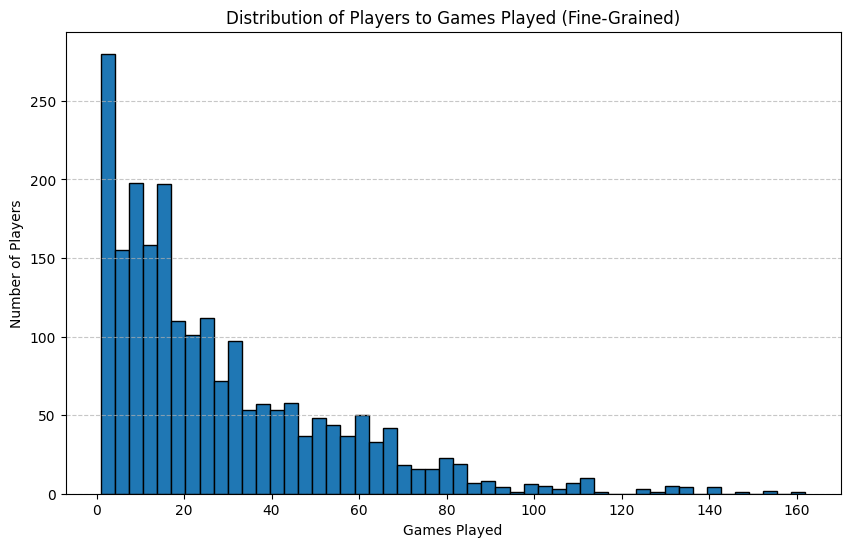

In [275]:
import matplotlib.pyplot as plt
gg['games_played'] = gg['wins'] + gg['loss']
plt.figure(figsize=(10, 6))
plt.hist(gg['games_played'], bins=50, edgecolor='black')  # Increasing the number of bins for finer granularity
plt.xlabel('Games Played')
plt.ylabel('Number of Players')
plt.title('Distribution of Players to Games Played (Fine-Grained)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [296]:
# let's match players to rankings from teams and give priority to the higher ranked players
# use vlr rankings for this
ranking_paths = glob.glob("/home/andrew/vct-hackathon/backend/data/vlr/rankings/*.json")
players_df = gg.copy()
import re
import unicodedata

# Function to clean team names by removing special characters
def clean_team_name(name):
    # Normalize to ASCII, ignoring anything that can't be converted
    name = unicodedata.normalize('NFKD', name).encode('ASCII', 'ignore').decode('utf-8')
    # Remove non-alphanumeric characters and lowercase
    name = re.sub(r'[^a-zA-Z0-9]', '', name).lower()
    return name
# Clean the team names in the player DataFrame
players_df['team_name_cleaned'] = players_df['team_name'].str.lower().str.replace(' ', '', regex=False)
merged_dfs = []
for r in ranking_paths:
    with open(r, 'r') as f:
        rankings_data = json.load(f)
    if len(rankings_data['data']) == 0:
        continue
    rankings_df = pd.DataFrame(rankings_data['data'])
    rankings_df['team_cleaned'] = rankings_df['team'].str.lower().str.replace(' ', '', regex=False).apply(clean_team_name)
    rankings_df = rankings_df[['rank', 'team_cleaned']]
    merged_df = players_df.merge(rankings_df, left_on='team_name_cleaned', right_on='team_cleaned', how='left')
    merged_dfs.append(merged_df)

final_df = pd.concat(merged_dfs, ignore_index=True)
print(final_df)
filtered_df = final_df[final_df['rank'].notna()]
print(filtered_df)

      player_name       team_name  wins  loss  player_kills  player_deaths  \
0            Sacy       Sentinels    57    45          1363           1478   
1         Boaster          FNATIC    95    41          1553           1817   
2             BLD           ODDIK    32    25           873            846   
3             ntk       The Union    32    34           908            951   
4           aspas            LOUD    96    58          2920           2178   
...           ...             ...   ...   ...           ...            ...   
28036         ran      Nuclear GC     0     2            23             32   
28037    PenEloPE      Nuclear GC     0     1             9             14   
28038        Arin      Nuclear GC     0     3            52             44   
28039     Alyssaa         Killer7     0     5            47             83   
28040      Tastyy  Fusion Esports     5     1           130             62   

       player_assists  player_kda  player_first_bloods  player_